# XRF Image Processing

In this notebook, we can sample, denoise, and generate optimal scanning maps.
There are four main sections:
1. [Data and Notebook Initialization](#1.-Data-and-Notebook-Initialization)
    1. [Imports](#1.A.-Imports)
    2. [Data Selection](#1.B.-Data-Selection)
    3. [Read Data](#1.C.-Read-Data)
        1. [XRF Data](#1.C.a.-XRF-Data)
        2. [Config File](#1.C.b.-Config-File)
2. [XRF Subsampling Simulation](#2.-XRF-Subsampling-Simulation)
    1. [Subsample XRF Data](#2.A.-Subsample-XRF-Data)
        1. [Sum Spectra Visualization](#2.A.a.-Sum-Spectra-Visualization)
        2. [Save Simulated XRF Volume](#2.A.b.-Save-Simulated-XRF-Volume)
    2. [Initial Fit Spectra](#2.B.-Initial-Fit-Spectra)
        1. [Visualize Spectra](#2.B.a.-Visualize-Spectra)
        2. [Save Elemental Maps](#2.B.b.-Save-Elemental-Maps)
3. [XRF Denoising](#3.-XRF-Denoising)
    1. [Loss Functions](#3.A.-Loss-Functions)
        1. [Poisson Negative Log Likelihood (PNLL)](#3.A.a.-Poisson-Negative-Log-Likelihood-(PNLL))
        2. [Poisson Total Variation (TV) Regularizer](#3.A.b.-Poisson-Total-Variation-(TV)-Regularizer)
        3. [Mean Squared Error](#3.A.c.-Mean-Squared-Error)
    2. [Volume Denoising](#3.B.-Volume-Denoising)
    3. [Elemental Map Denoising](#3.C.-Elemental-Map-Denoising)
        1. [Analysis](#3.C.a.-Analysis)
    4. [Elemental Map Hyperparameter Optimization](#3.D.-Elemental-Map-Hyperparameter-Optimization)
        1. [Analysis](#3.D.a.-Analysis)
4. [XRF Scanning](#4.-XRF-Scanning)
    1. [Dwell Mask Optimization](#4.A.-Dwell-Mask-Optimization)
        1. [Analysis](#4.A.a.-Analysis)

---

# 1. The XRF Image Processing Package

Here, we import the necessary libraries we need to run the notebook.
Additionally, we can choose the data to use for the notebook.

The standard packages should be available for Python 3 (maybe not h5py).
In any case, please make sure that the following packages are installed:
- [h5py](https://www.h5py.org): Reading/Writing h5 files
- [matplotlib](https://matplotlib.org): Plotting and image viewing
- [numpy](https://numpy.org): Numerics package
- [pillow/PIL](https://pillow.readthedocs.io/en/stable/): Image reading
- [torch & torchvision](https://pytorch.org): Optimization package
- [pymca](https://pymca.sourceforge.net): XRF processing
- xrfip: XRF image processing (included with this notebook)

In [1]:
# Standard packages
import csv
import h5py
import os
import time
import math
import random

# Math packages
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import torch
import torchvision
# from opt_v2 import opt_mask_v3

# PyMca packages
from PyMca5.PyMca import ConfigDict
from torch.utils.data import DataLoader, Dataset
# XRF image processing packages
import xrfip as xp
import xrfip.optimization as opt
from xrfip.optimization.losses import *
from torch.nn import functional as F
from xrfip.utils.errors import *
from xrfip.utils.units import *
from xrfip.utils.visualizations import *
from xrfip.utils.save_mask import save_mask

## Using xrfip



## 1.B. Data Selection

Here, you'll select the paths to the data as well as identifying the scan time to obtain the XRF data and optionally the desired simulated time.

In [2]:
dwell_act = 100*ms
data_name = 'Thoma_2017_72_fullscan_none'

act_dir = os.path.join('data',
                        data_name)

# XRF count data path
xrf_path = os.path.join(act_dir,
                        'orig_u{:.2f}ms_xrf.h5'.format(1000 * dwell_act))

# Select path to config file
cfg_path = os.path.join(act_dir,
                        'orig_u100.00ms_config.cfg')

# RGB image path
rgb_path = os.path.join(act_dir,
                        data_name + '.png')

# Save directory
save_dir = os.path.join('simulations',
                        data_name)

# Actual/original XRF info
origin = [0.0, 0.0]
spacing = [0.5*mm, 0.5*mm]

# Simulated dwell time per pixel (in seconds)
dwell_sim = 7*ms

## 1.C. Read Data

Here, we'll read the data

### 1.C.a. XRF Data

1. Read in the XRF data in the first code block.
2. Adjust the XRF using the second block so that it's organized by $C \times H \times W$ where $C$ is the energy dimension, $H$ is the height, and $W$ is the width. The `np.transpose` function can be used to switch the ordering of the axes.
3. Check that the dimensions are correct using the third block.

In [3]:
# Read XRF data
with h5py.File(xrf_path, 'r') as hf:
    xrf_act = xp.xrf(data = hf['data'][:],
                     dwell = dwell_act,
                     origin = origin,
                     spacing = spacing)

In [4]:
# XRF adjustments
xrf_act = np.transpose(xrf_act, (0,2,1))

In [5]:
# Print XRF info
print('Original XRF Info\n',
      'Dwell Time: {} ms\n'.format(xrf_act.dwell_in(ms)),
      'Channels:   {} px\n'.format(xrf_act.shape[0]),
      'Height:     {} px ({:.5} mm)\n'.format(xrf_act.shape[1], xrf_act.height_in(mm)),
      'Width:      {} px ({:.5} mm)\n'.format(xrf_act.shape[2], xrf_act.width_in(mm)),
      'Origin:     {} mm\n'.format(xrf_act.origin_in(mm, axis = [1,2])),
      'Spacing:    {} mm\n'.format(xrf_act.spacing_in(mm, axis = [1,2])),
      'Type:       {}'.format(xrf_act.dtype))

Original XRF Info
 Dwell Time: 100.00000149011612 ms
 Channels:   4096 px
 Height:     566 px (282.5 mm)
 Width:      423 px (211.0 mm)
 Origin:     [0. 0.] mm
 Spacing:    [0.5, 0.5] mm
 Type:       uint16


### 1.C.c. RGB Image

Read in the color image file.

RGB is registered with the XRF data.


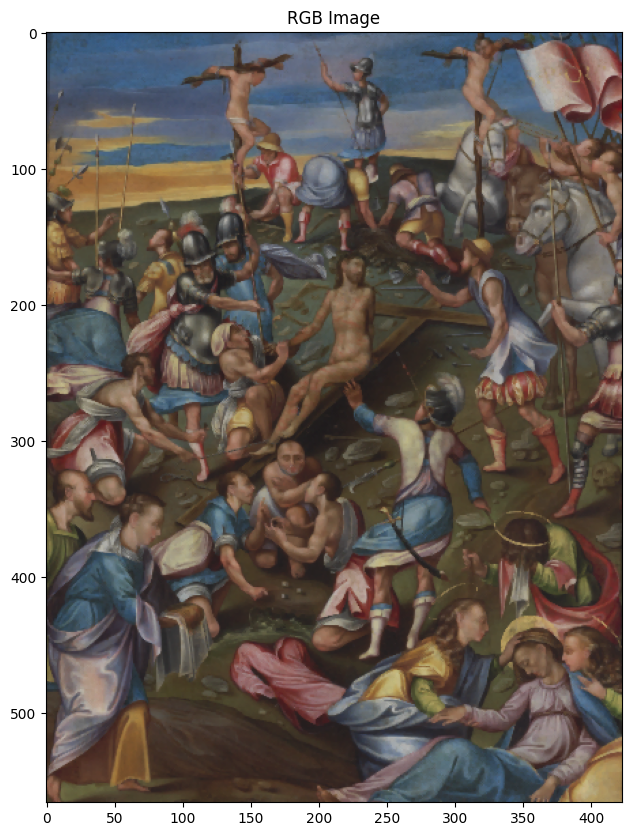

In [6]:
# Read RGB image
if isinstance(rgb_path, str) and len(rgb_path) > 0:
    rgb = xp.rgb(rgb_path, origin, spacing)

    # Display RGB image
    fig, ax = plt.subplots(1, figsize = (10,10))
    ax.imshow(rgb.channels_as_last_dim())
    ax.set_title('RGB Image')

    print('RGB is registered with the XRF data.')
else:
    rgb = None
    print('RGB image will not be used.')

### 1.C.b. Config File

Read in the config file by setting its path.

In [7]:
# Read config file
config = ConfigDict.ConfigDict()
config.read(cfg_path)

---

# 2. XRF Subsampling Simulation

Here, you have the option to simulate a scan at any dwell time.
You can use this to test the limit of the algorithm in a simulated environment.
Alternatively, you can also load a previously sampled volume.

## 2.A. Subsample XRF Data

In [8]:
# Choose data if exists
sim_dir = os.path.join(save_dir,
                       'sim_u{:.2f}ms'.format(1000 * dwell_sim))
sim_xrf_path = os.path.join(sim_dir,
                            'sim_u{:.2f}ms.h5'.format(1000 * dwell_sim))

In [9]:
# Read previusly sampled data
if os.path.exists(sim_xrf_path):
    xrf_sim = xp.xrf(sim_xrf_path)
    print('Simulated data was read in.')

# Newly sample data
else:
    xrf_sim = xrf_act.sample(dwell_sim)
    print('Simulated data was created.')

Simulated data was read in.


In [10]:
xrf_sim[:10].shape

(10, 566, 423)

In [11]:
# Print XRF info
print('Simulated XRF Info\n',
      'Dwell Time: {} ms\n'.format(xrf_sim.dwell_in(ms)),
      'Channels:   {} px\n'.format(xrf_sim.shape[0]),
      'Height:     {} px ({:.5} mm)\n'.format(xrf_sim.shape[1], xrf_sim.height_in(mm)),
      'Width:      {} px ({:.5} mm)\n'.format(xrf_sim.shape[2], xrf_sim.width_in(mm)),
      'Origin:     {} mm\n'.format(xrf_sim.origin_in(mm, axis = [1,2])),
      'Spacing:    {} mm\n'.format(xrf_sim.spacing_in(mm, axis = [1,2])),
      'Type:       {}'.format(xrf_sim.dtype))

Simulated XRF Info
 Dwell Time: 7.0 ms
 Channels:   4096 px
 Height:     566 px (282.5 mm)
 Width:      423 px (211.0 mm)
 Origin:     [0. 0.] mm
 Spacing:    [0.5, 0.5] mm
 Type:       uint8


## 2.B. Initial Fit Spectra

Use this to generate the elemental maps through PyMca.
These maps represent an abundance $\mathbf{A} \in \mathbb{R}_+^{M \times H \times W}$ where $M$ is the number of maps generated.
Each map denotes the amount of a set response from each element, which we denote as $D \in \mathbb{R}_+^{C \times M}$.
We will use the fit as an initial estimation for denoising. 

In [12]:
# Fit spectra on actual data
act_dict_path = os.path.join(act_dir,
                             'orig_u{:.2f}ms_spectra.h5'.format(1000 * dwell_act))

act_map_path = os.path.join(act_dir,
                            'orig_u{:.2f}ms_maps'.format(1000 * dwell_act))
act_map_path_prefix = 'orig_u{:.2f}ms_'.format(1000 * dwell_act)

if os.path.exists(act_dict_path) and os.path.exists(act_map_path):
    D_act = xp.spectrum(act_dict_path)
    A_act = xp.elemap(act_map_path)
    print('Actual dictionary and abundance were read in.')
else:
    D_act, A_act = xrf_act.fit_spectra(config)
    print('Actual dictionary and abundance were generated.')

Actual dictionary and abundance were read in.


In [13]:
# Fit spectra on simulated data
sim_dict_path = os.path.join(sim_dir,
                             'sim_u{:.2f}ms_spectra.h5'.format(1000 * dwell_sim))

sim_map_path = os.path.join(sim_dir,
                            'sim_u{:.2f}ms_maps'.format(1000 * dwell_sim))
sim_map_path_prefix = 'sim_u{:.2f}ms_'.format(1000 * dwell_sim)

if os.path.exists(sim_dict_path) and os.path.exists(sim_map_path):
    D_sim = xp.spectrum(sim_dict_path)
    A_sim = xp.elemap(sim_map_path)
    print('Simulated dictionary and abundance were read in.')
else:
    D_sim, A_sim = xrf_sim.fit_spectra(config)
    print('Simulated dictionary and abundance were generated.')

Simulated dictionary and abundance were read in.


### 2.B.a. Visualize Spectra

Below, you can visualize the maps. Set `rng_min` and/or `rng_max` to `None` to automatically find a display range.

### 2.B.b. Save Elemental Maps

Here you can optionally save the maps.
The first block is for saving the maps from the actual data, and the second is for the simulated data.

In [14]:
# Save original maps
if not os.path.exists(act_map_path):
    A_act.save(act_map_path, act_map_path_prefix)
    print('Actual maps are saved.')
else:
    print('Actual maps already exist.')

# Save original dictionary
if not os.path.exists(act_dict_path):
    D_act.save(act_dict_path)
    print('Actual spectra is saved.')
else:
    print('Actual spectra already exist.')

Actual maps already exist.
Actual spectra already exist.


still have to augment images


In [15]:
# Save simluated maps
if not os.path.exists(sim_map_path):
    A_sim.save(sim_map_path, sim_map_path_prefix)
    print('Simulated maps are saved.')
else:
    print('Simulated maps already exist.')

# Save simulated dictionary
if not os.path.exists(sim_dict_path):
    D_sim.save(sim_dict_path)
    print('Simulated spectra are saved.')
else:
    print('Simulated spectra already exist.')

Simulated maps already exist.
Simulated spectra already exist.


---

# 3. XRF Denoising

We provide two options for denoising the XRF data.
Here are the two options:
1. Denoise the XRF volume. This option smooths the raw photon counts in the channels specified by the config file. The elemental maps are then generated from the denoised XRF volume. It requires more time and memory, but works with the raw data directly.
2. Denoise the elemental maps. This option smooths the elemental maps individually. It is considerably faster, but relies on the estimation of the elemental maps from the raw data.

Each option uses PyTorch to perform the denoising optimization.

## 3.A. Loss Functions

Here we define the loss functions that compose the denoising optimization.
We will start defining functions.

### 3.A.a. Poisson Negative Log Likelihood (PNLL)

In denoising, we cannot stray too far away from the data we recorded.
To prevent this, we need a distance function.
We define our distance using the PNLL:

$$
\mathcal{P}_{\text{NLL}}(x,y) = 
\begin{cases}
    x - y \cdot \ln(x) & \text{if standard NLL desired} \\
    x - y \cdot (1 + \ln(x) - \ln(y)) & \text{if} \min_x \mathcal{P}_{\text{NLL}}(x,y) = 0 \text{ desired}
\end{cases}
$$

where $x$ is the prediction and $y$ is the target.
Notice that when $x = y$, the PNLL is 0.
It can be shown that this is the global minimum.
Additionally, the PNLL is *not* symmetric, meaning that $\mathcal{P}(x,y) \neq \mathcal{P}(y,x)$.

When we code this, we add a small epsilon value to prevent `nan` values arising from $\ln(0)$ cases.

Kullback-Leibler Divergence
$$
\mathcal{P}_{\text{KLD}}(x,y) = x - y \cdot (1 + \ln(x) - \ln(y))
$$

Jeffreys Divergence
$$
\begin{align}
    \mathcal{P}_{\text{JD}}(x,y) &= \mathcal{P}_{\text{KLD}}(x,y) + \mathcal{P}_{\text{KLD}}(y,x) \\
    &= (x - y) \cdot \left(\ln(x) - \ln(y)\right)
\end{align}
$$

Jensen-Shannon Divergence
$$
\begin{align}
\mathcal{P}_{\text{JSD}}(x,y,\alpha_x,\alpha_y) &= \mathcal{P}_{\text{KLD}}\left(x,\frac{\alpha_x x + \alpha_y y}{\alpha_x + \alpha_y}\right) + \mathcal{P}_{\text{KLD}}\left(y,\frac{\alpha_x x + \alpha_y y}{\alpha_x + \alpha_y}\right) \\
&= x + y - \frac{\alpha_x x + \alpha_y y}{\alpha_x + \alpha_y} \left(2 + \ln(x) + \ln(y) - 2\ln\left(\frac{\alpha_x x + \alpha_y y}{\alpha_x + \alpha_y}\right)\right)
\end{align}
$$

Total Variation (Upper Bound)
$$
\begin{align}
    \mathcal{P}_{\text{TV}}(x,y) &= \sqrt{\mathcal{P}_{\text{KLD}}(x,y)} \\
    &= \sqrt{x - y \cdot (1 + \ln(x) - \ln(y))}
\end{align}
$$

### 3.A.b. Poisson Total Variation (TV) Regularizer

In order to smooth the data, we need to add a regularizer.
Without it, minimizing the PNLL alone is trivial as the raw data itself is the minimum.
Typically for a TV regularizer, an L2 norm of the spatial differences serves as the basis for the smoothing function.

Instead, we define a PNLL-based TV regularizer, which is simply the symmetrized/average PNLL of two neighboring pixels.
In the 1-dimensional case, the TV regularizer is:
$$
\text{TV}^{\text{PNLL}}(x) = \frac{1}{2(N - 1)} \sum_{i = 1}^{N-1}(x_i - x_{i+1}) \cdot (\ln x_i - \ln x_{i+1}).
$$

This is applied along both spatial dimensions to smooth the data.

Optionally, an RGB image registered with the XRF data can be used as an adaptive weighting scheme to indicate the presence of known edges.

#### Epsilon

Like the PNLL, there is a small value added to ensure `nan` values don't occur with zero-valued entries.
Sometimes, these zero values are too overpowering, leaving "craters" in the denoised result.
To fix this, we recommend increasing the epsilon value.

### 3.A.c. Mean Squared Error

A common metric to evaluate how a denoiser performs is using the (root) mean-squared error, which we provide here.

### 3.A.d. Simulated Data Error

With the metrics defined, we can calculate the errors between the simulated data and the actual data.
These results can be optionally saved.

In [16]:
sim_err_path = os.path.join(sim_dir,
                            'sim_u{:.2f}ms_error.csv'.format(1000 * dwell_sim))

In [17]:
if not os.path.exists(sim_err_path):

    sim_err = []

    # Calculate error of simulated XRF volume
    err = calculate_error(xrf_sim.astype(np.single).rates(),
                          xrf_act.astype(np.single).rates())
    sim_err.append(['Vol', err['MSE'], err['RMSE'], err['PNLL']])

    # Calculate error of simulated XRF maps
    for i in range(A_sim.shape[0]):
        err = calculate_error(A_sim[i,:,:].rates().astype(np.single),
                              A_act[i,:,:].rates().astype(np.single))
        sim_err.append([A_act.elements[i], err['MSE'], err['RMSE'], err['PNLL']])
        
    print('Simulated errors were calculated.\n')
    
else:
    sim_err, _ = read_error(sim_err_path)
    print('Simulated errors were read in.\n')
                
print_error(sim_err)

Simulated errors were read in.

Data	MSE		RMSE		PNLL
Vol	5.063e+03	7.115e+01	6.532e+01
Ar K	1.528e+05	3.910e+02	1.366e+02
Au L	1.915e+05	4.376e+02	1.791e+02
Au M	2.619e+03	5.118e+01	4.194e+01
Ca K	6.458e+04	2.541e+02	9.573e+01
Cu K	1.129e+06	1.063e+03	8.124e+01
Fe K	2.775e+05	5.268e+02	8.763e+01
Hg L	3.695e+05	6.078e+02	1.019e+02
Hg M	2.697e+05	5.193e+02	1.161e+02
K K	1.651e+04	1.285e+02	1.160e+02
Mn K	5.150e+04	2.269e+02	5.436e+01
Ni K	6.937e+04	2.634e+02	4.521e+01
Pb L	9.958e+06	3.156e+03	9.203e+01
Pb M	9.477e+05	9.735e+02	2.009e+02
Rh K	1.271e+07	3.565e+03	2.362e+03
Rh L	3.960e+05	6.293e+02	1.062e+02
S K	1.572e+03	3.964e+01	4.016e+01
Sn K	5.956e+03	7.718e+01	3.896e+01
Sn L	7.036e+04	2.652e+02	1.223e+02
Ti K	1.313e+04	1.146e+02	6.102e+01
Zn K	1.229e+05	3.506e+02	1.095e+02


In [18]:
# Save results
if not os.path.exists(sim_err_path):
    save_error(sim_err_path, sim_err, header = ['Data', 'MSE', 'RMSE', 'PKLD'])
    print('Error saved.')
else:
    print('Error was already saved.')

Error was already saved.


## 3.B. Loss Construction

In [19]:
# Convert xrfip.RGB to torch.Tensor
rgb_beta = 16
if isinstance(rgb, xp.data.RGB):
    rgb_torch = torch.from_numpy(rgb.view(np.ndarray)).float()
    w1 = (-1.0 * rgb_beta * ((rgb_torch[...,:-1,:] - rgb_torch[...,1:,:]) ** 2).sum(dim = 0)).exp()
    w2 = (-1.0 * rgb_beta * ((rgb_torch[...,:,:-1] - rgb_torch[...,:,1:]) ** 2).sum(dim = 0)).exp()
    del rgb_torch
    print('RGB weights initialized.')
else:
    rgb_weights = None
    print('RGB weights ignored.')

RGB weights initialized.


In [20]:
loss_fid = PoissonKLD()

loss_reg = PoissonRegularizer(loss = PoissonJD(reduction = None),
                              w1 = w1, w2 = w2, symmetrize = False, grad_ref = True)

[]()

## 3.D. Elemental Map Hyperparameter Optimization

If the data for smoothing is sampled from the original scan, the optimal hyperparameter can be selected by trying different values.

In [21]:
# Optimized results directory
opt_dir = os.path.join(sim_dir,
                       'sim_u{:.2f}ms_den_ltv_opt'.format(1000 * dwell_sim))

# Optimized maps directory
opt_map_dir = os.path.join(opt_dir,
                           'sim_u{:.2f}ms_den_ltv_opt_maps'.format(1000 * dwell_sim))
opt_map_dir_prefix = 'sim_u{:.2f}ms_den_ltv_opt_'.format(1000 * dwell_sim)

# Optimized parameter
opt_error_path = os.path.join(opt_dir,
                              'sim_u{:.2f}ms_den_ltv_opt_error.csv'.format(1000 * dwell_sim))

if os.path.exists(opt_map_dir): 
    opt_maps = xp.elemap(opt_map_dir)
    
    if os.path.exists(opt_error_path):
        opt_err, _ = read_error(opt_error_path)

        opt_results = []
        for i in range(opt_maps.shape[0]):
            opt_results.append([opt_maps[i,:,:], opt_err[i][1:5]])

        print('Optimized maps ({}) and error were read in.'.format(', '.join(opt_maps.names[0])))
    else:
        print('Optimized maps ({}) were read in.'.format(', '.join(opt_maps.names[0])))
    
else:
    print('No optimized maps found.')

Optimized maps (Au L, Ca K, Cu K, Fe K, Hg L, Hg M, Mn K, Ni K, Pb L, Pb M, Sn L, Ti K) and error were read in.


# Denoising and predicting time parameters

In [22]:
from importlib import reload

from unet import UNet
from unet2 import SimpleUNet
from regularizers import anscombe_transform
from training import train_model
from dataset import XRFDataset
%reload_ext autoreload
%autoreload 2
from torch import nn

# set torch mps 
if torch.cuda.is_available():
    device =  torch.device("cuda")
elif torch.backends.mps.is_available():
    print("mps")
    device = torch.device("mps")
else:
    print("cpu")
    device = torch.device("cpu")

mps


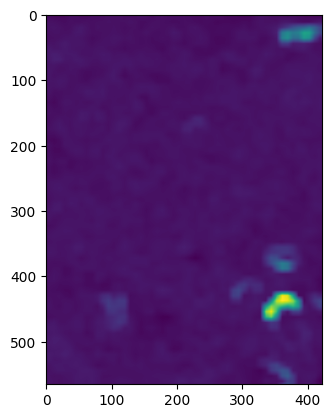

In [23]:
from skimage.transform import resize

def get_windows(im, window, stride):
    im = im.unfold(-2,
                   window if isinstance(window, int) else window[0],
                   stride if isinstance(stride, int) else stride[0])
    im = im.unfold(-2,
                   window if isinstance(window, int) else window[1],
                   stride if isinstance(stride, int) else stride[1])

    return im

def normalize_image(im):
    im_min = im.min()
    return (im - im_min) / (im.max() - im_min)

def windowed_var(data, window):
    
    var_im = get_windows(data, window, 8).var(dim = [-2, -1]).mean(dim = 0)
    return var_im / var_im.sum()

windowed_au_map = windowed_var(torch.tensor(A_sim['Au L']).float(), window = 16)
plt.imshow(resize(np.sqrt(windowed_au_map.numpy()), A_sim.shape[1:]))

In [24]:
# xrf_gold_map = A_sim['Hg L'].rates()
xrf_gold_map = A_sim['Pb L'].rates()
element = 'PbL'
# xrf_gold_map = A_sim['Ni K'].rates()


# xrf__map = A_sim['Au L'].rates()

# print(type(xrf_gold_map))
print(xrf_gold_map.mean())
print(xrf_gold_map.min())
print(xrf_gold_map.max())
# A_sim['Au L'].shape[-1]*A_sim['Au L'].shape[-2]

53376.59511878205
249.12469482421875
82195.6171875


## Denoising the Gold Elemental Map 

Look at the pipeline for the details. 


First try the Anscombe transform and then evaluate the MSE loss. Or we could try applying the Anscombe, reverse transform the data then apply Poisson NLLL. 

In [ ]:
# Training arguments
N = 1024
# K pixels
K = 64
crop_size = 16
ups_win = 5
epochs = 10
beta = 0.5
# grab some elements 
xrf = torch.tensor(xrf_gold_map, dtype=torch.float32, device=device)
anscombe_xrf = anscombe_transform(xrf)
xrf_parameters = [anscombe_xrf.mean(), anscombe_xrf.std()]
# standard 
# xrf = (xrf)
# t_total = 8*ms
t_total =3*ms*xrf.shape[-2]*xrf.shape[-1]
t0 = 7*ms
t_avg = t_total / (xrf.shape[-2] * xrf.shape[-1])
# to access the batch dimensions
# ii = torch.arange(N * K) // K  # This is for indexing

# PyTorch dataset
xrf_data = XRFDataset(xrf = xrf,
                      crop_size = crop_size,
                      k = K,
                      ups_win = ups_win,
                      training = True)
# Data loader
loader = torch.utils.data.DataLoader(dataset=xrf_data,
                                     shuffle=True,
                                     batch_size=N)                              

# channels is the first dim 
# model = torch.nn.Sequential(torch.nn.Conv2d(in_channels = xrf.shape[0],
#                                                 out_channels = 1,
#                                                 kernel_size = 3,
#                                                 padding = 1,
#                                                 bias = True),
#                                 torch.nn.ReLU()
#                                 ).to(device)
model = UNet(channels=xrf.shape[0]).to(device)
# model = SimpleUNet(channels=xrf.shape[0]).to(device)

# initialize the weights
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        # xavier initialization
        torch.nn.init.xavier_uniform_(m.weight)
# model.apply(init_weights)

# Neural net
# change the loss function to poisson kl divergence
# loss_fn = torch.nn.MSELoss()
# loss_fn = mse()
opt = torch.optim.Adam(params = model.parameters(),
                       lr = 1e-5)

loss_hist_pkld, model = train_model(
    model=model,
    loader=loader,
    xrf_params = xrf_parameters,
    loss_fn = PoissonKLD(),  
    # loss_fn=torch.nn.MSELoss(),  # Use different loss function here
    opt=opt,
    device=device,
    epochs=epochs,
    N=N,
    K=K,
    t_avg=t_avg,
    t0=t0,
    beta = 0,
    target_total_time = t_total
)


/Users/odepp21/opt/anaconda3/envs/tergel/lib/python3.11/site-packages/torch/autograd/__init__.py:251: UserWarning: The operator 'aten::sgn.out' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/mps/MPSFallback.mm:13.)
  Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch: 1/10 | Batch: 0001/234 | Loss: 65.91218
Epoch: 1/10 | Batch: 0002/234 | Loss: 67.35985
Epoch: 1/10 | Batch: 0003/234 | Loss: 70.70122
Epoch: 1/10 | Batch: 0004/234 | Loss: 68.39398
Epoch: 1/10 | Batch: 0005/234 | Loss: 64.00281
Epoch: 1/10 | Batch: 0006/234 | Loss: 65.29026
Epoch: 1/10 | Batch: 0007/234 | Loss: 67.61223
Epoch: 1/10 | Batch: 0008/234 | Loss: 68.34317
Epoch: 1/10 | Batch: 0009/234 | Loss: 63.89244
Epoch: 1/10 | Batch: 0010/234 | Loss: 64.99085
Epoch: 1/10 | Batch: 0011/234 | Loss: 65.86549
Epoch: 1/10 | Batch: 0012/234 | Loss: 64.29388
Epoch: 1/10 | Batch: 0013/234 | Loss: 63.05215
Epoch: 1/10 | Batch: 0014/234 | Loss: 67.60455
Epoch: 1/10 | Batch: 0015/234 | Loss: 66.14132
Epoch: 1/10 | Batch: 0016/234 | Loss: 62.85001
Epoch: 1/10 | Batch: 0017/234 | Loss: 65.04337
Epoch: 1/10 | Batch: 0018/234 | Loss: 63.71553
Epoch: 1/10 | Batch: 0019/234 | Loss: 65.35160
Epoch: 1/10 | Batch: 0020/234 | Loss: 64.07221


KeyboardInterrupt: 

MSE Loss

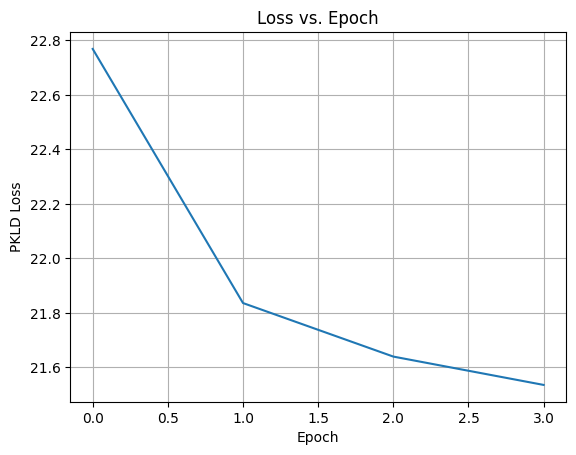

In [ ]:
# Plot loss
plt.plot(np.arange(len(loss_hist_pkld)), np.array(loss_hist_pkld))
plt.title('Loss vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('PKLD Loss')
plt.grid()

Fe K leanring curves

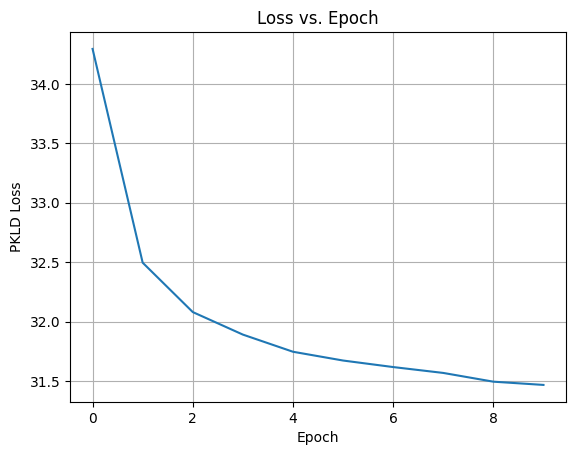

In [68]:
# Plot loss
plt.plot(np.arange(len(loss_hist_pkld)), np.array(loss_hist_pkld))
plt.title('Loss vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('PKLD Loss')
plt.grid()

20 epoch learning curve for Ni K

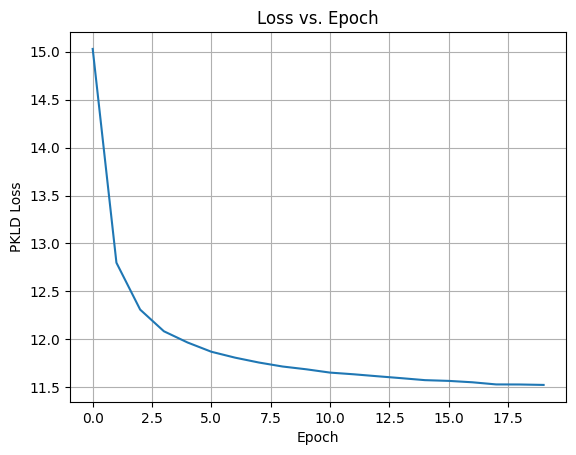

In [58]:
# Plot loss
plt.plot(np.arange(len(loss_hist_pkld)), np.array(loss_hist_pkld))
plt.title('Loss vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('PKLD Loss')
plt.grid()

10 epochs looks good to train on

For lr = 1e-4

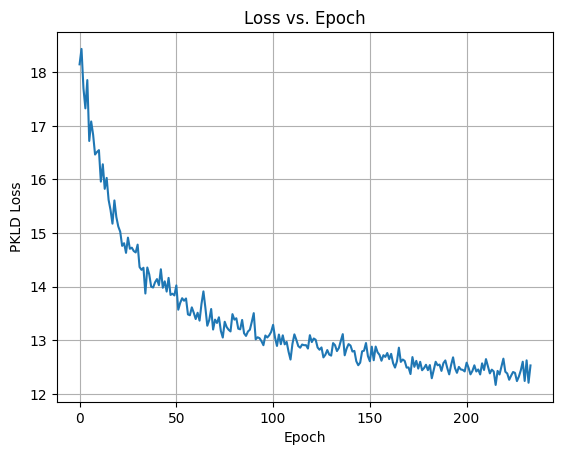

In [51]:
# Plot loss
plt.plot(np.arange(len(loss_hist_pkld)), np.array(loss_hist_pkld))
plt.title('Loss vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('PKLD Loss')
plt.grid()

using xavier distirbution initialization

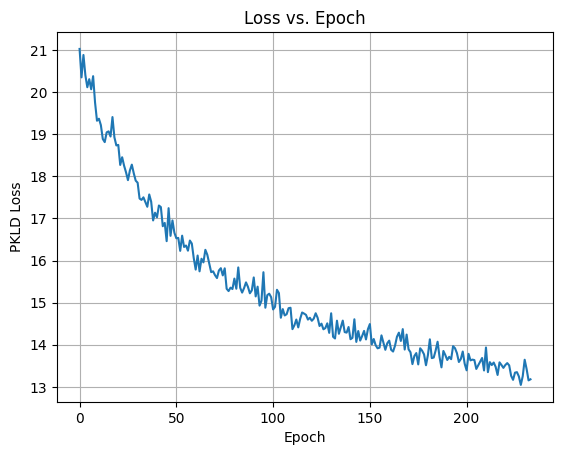

In [49]:
# Plot loss
plt.plot(np.arange(len(loss_hist_pkld)), np.array(loss_hist_pkld))
plt.title('Loss vs. Epoch')
plt.xlabel('Epoch')
plt.ylabel('PKLD Loss')
plt.grid()

In [84]:

# loop through state dictionary to print out parameters and names
for key in model.state_dict():
    print(key, model.state_dict()[key])

# check decoder.3.double_conv.double_conv.0.weight 
# decoder.0.double_conv.double_conv.0.weight tensor


encoder.0.double_conv.double_conv.0.weight tensor([[[[ 2.0655e-01,  2.1195e-01, -3.1917e-02],
          [ 3.2961e-02,  3.1068e-01, -1.7696e-01],
          [-4.0710e-02, -1.0809e-01, -2.6193e-01]]],


        [[[ 8.3861e-02, -6.9705e-02, -9.7551e-02],
          [ 3.2691e-02, -2.8946e-01,  2.1735e-01],
          [-2.9772e-01,  3.0068e-01, -1.9687e-01]]],


        [[[-2.0890e-01,  3.1013e-01, -7.7401e-02],
          [-2.1187e-01, -2.7426e-01, -2.1882e-01],
          [ 3.4099e-01,  2.6677e-01, -4.2241e-02]]],


        [[[ 1.6339e-01, -8.7505e-02,  1.7993e-02],
          [-2.8135e-01, -2.6349e-01, -8.8982e-02],
          [ 6.1294e-02,  1.6701e-01,  3.3775e-01]]],


        [[[ 5.3431e-02, -2.1586e-01, -1.2033e-01],
          [ 6.8783e-02,  1.5686e-01,  2.0291e-01],
          [ 3.1548e-01, -2.2970e-01, -7.9585e-03]]],


        [[[-1.0652e-01, -7.8891e-02, -1.6842e-01],
          [ 3.4083e-02,  1.0720e-01,  1.5057e-01],
          [-5.9215e-02, -1.5217e-01,  2.8270e-01]]],


        [[[-2.2

For 1e-5

In [51]:
# testing on pixels selected 

# Get dwell mask 
xrf_data = XRFDataset(xrf = torch.tensor(xrf_gold_map).float(),
                      crop_size = crop_size,
                      k = K,
                      ups_win = ups_win,
                      training = False)
loader = torch.utils.data.DataLoader(dataset = xrf_data,
                                     shuffle = False,
                                     batch_size = N)

model.eval()
t = torch.zeros(1,*xrf.shape[-2:]).to(device)
with torch.no_grad():
    for crop, r, c in loader:
        crop = crop.to(device)
        r = r.to(device)
        c = c.to(device)
        crop = anscombe_transform(crop)
        # print(model((crop-xrf.mean())/xrf.std()).shape)
        t[0,r,c] = model((crop-xrf_parameters[0])/xrf_parameters[1])[:,0,crop_size//2,crop_size//2]    
        # print(model((crop-xrf_parameters[0])/xrf_parameters[1]))
        # print(t.shape)
        # print(t[0,r,c])
            
t_new = t

t *= t_avg / t.mean()
print(f'Requested average time: {t_avg}\nReceived average time:  {t.mean().item()}\n')
print(f'Requested total time: {t_total}\nReceived total time:  {t.sum().item()}')

Requested average time: 0.007000000000000001
Received average time:  0.007000000681728125

Requested total time: 1675.9260000000002
Received total time:  1675.9261474609375


MSE Loss after Anscombe transform

In [24]:
mask_next = t.cpu()

display_mask(mask_disp = mask_next,
             name = 'Mask, Average Dwell at {} ms'.format(round(1000*mask_next.mean().item(),2)),
             rng = [0.0, mask_next.max()],
             hist_bins = 200)
print(t.mean().item())
# Save mask
mask_path = "masks/"+str(int(dwell_sim*1000))+"ms" +"/PKLD"+element+"8ms"+"_mask.tif"
save_mask(mask_next.numpy(), os.path.join(mask_path))


NameError: name 't' is not defined

# LOAD IN MAPS

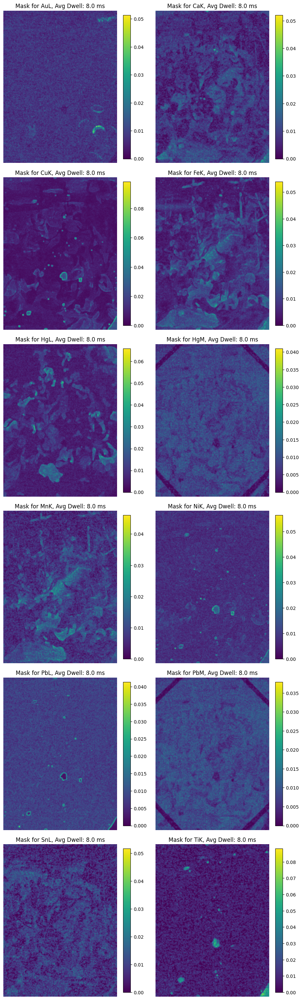

In [43]:
elements = ["AuL", "CaK", "CuK", "FeK", "HgL", "HgM", "MnK", "NiK", "PbL", "PbM", "SnL", "TiK"]
init_dwell = "2"
mask_folder = f"masks/{init_dwell}ms/"  
mask_suffix = "8ms_mask.tif"  
num_elements = len(elements)
cols = 2 
rows = (num_elements + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10, 5 * rows))
axes = axes.flatten()  

for idx, element in enumerate(elements):
    mask_path = os.path.join(mask_folder, f"MSE{element}{mask_suffix}")
    
    # Check if the mask file exists
    if not os.path.exists(mask_path):
        print(f"Mask file for element '{element}' not found at path: {mask_path}")
        continue
    
    # Load the mask image
    try:
        mask_image = Image.open(mask_path)
    except Exception as e:
        print(f"Error loading image for element '{element}': {e}")
        continue
    
    mask_np = np.array(mask_image)
    mask_tensor = torch.from_numpy(mask_np).float()
    average_dwell_ms = round(1000 * mask_tensor.mean().item(), 2)
    
    display_name = f"Mask for {element}, Avg Dwell: {average_dwell_ms} ms"
    display_rng = [0.0, mask_tensor.max().item()]
    
    # Display the mask in the subplot
    ax = axes[idx]
    im = ax.imshow(mask_tensor, cmap='viridis', vmin=display_rng[0], vmax=display_rng[1])
    ax.set_title(display_name)
    ax.axis('off')  # Hide axes ticks
    
    # Optionally, add a colorbar to each subplot
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# If there are unused subplots, hide them
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

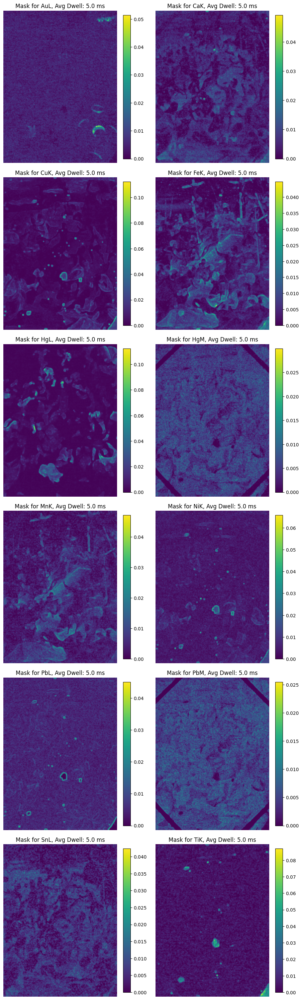

In [ ]:
elements = ["AuL", "CaK", "CuK", "FeK", "HgL", "HgM", "MnK", "NiK", "PbL", "PbM", "SnL", "TiK"]
init_dwell = "5"
mask_folder = f"masks/{init_dwell}ms/"  
mask_suffix = f"{init_dwell}_mask.tif"  
num_elements = len(elements)
cols = 2 
rows = (num_elements + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(10, 5 * rows))
axes = axes.flatten()  

for idx, element in enumerate(elements):
    mask_path = os.path.join(mask_folder, f"MSE{element}{mask_suffix}")
    
    # Check if the mask file exists
    if not os.path.exists(mask_path):
        print(f"Mask file for element '{element}' not found at path: {mask_path}")
        continue
    
    # Load the mask image
    try:
        mask_image = Image.open(mask_path)
    except Exception as e:
        print(f"Error loading image for element '{element}': {e}")
        continue
    
    mask_np = np.array(mask_image)
    mask_tensor = torch.from_numpy(mask_np).float()
    average_dwell_ms = round(1000 * mask_tensor.mean().item(), 2)
    
    display_name = f"Mask for {element}, Avg Dwell: {average_dwell_ms} ms"
    display_rng = [0.0, mask_tensor.max().item()]
    
    # Display the mask in the subplot
    ax = axes[idx]
    im = ax.imshow(mask_tensor, cmap='viridis', vmin=display_rng[0], vmax=display_rng[1])
    ax.set_title(display_name)
    ax.axis('off')  # Hide axes ticks
    
    # Optionally, add a colorbar to each subplot
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# If there are unused subplots, hide them
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

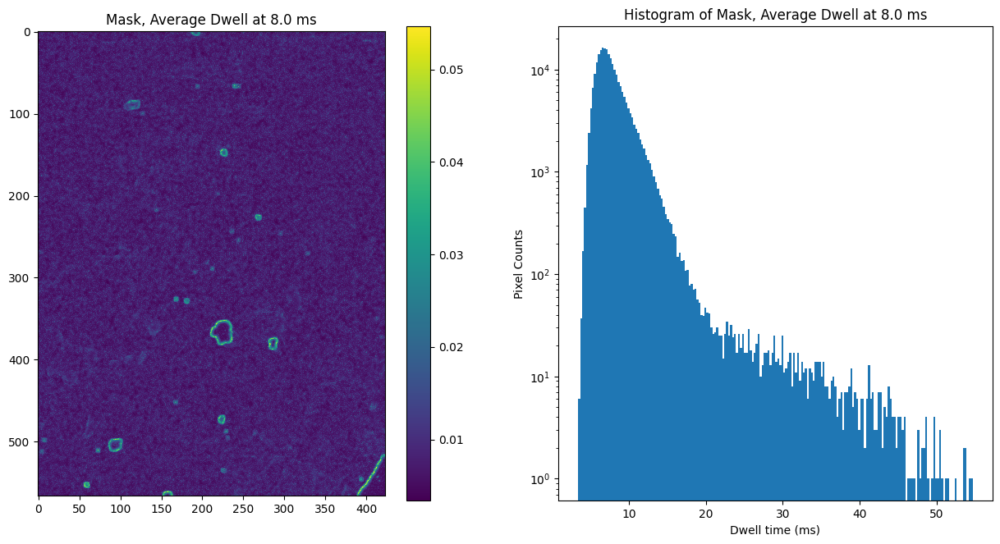

In [31]:


element = 'PbL'
mask_path = "masks/2ms/"+element+"8ms_mask.tif"
mask_next = torch.from_numpy(np.array(Image.open(mask_path))).float()

display_mask(mask_disp = mask_next,
             name = 'Mask, Average Dwell at {} ms'.format(round(1000*mask_next.mean().item(),2)),
             rng = [0.0, mask_next.max()],
             hist_bins = 200)
# print(t.mean().item())
# Save mask
# mask_path = "MSE"+element+"8ms"+"_mask.tif"
# save_mask(mask_next.numpy(), os.path.join(mask_path))


In [54]:
print(f"mode: {mask_next.flatten().mode()}")
print(f'max: {mask_next.max()}')

mode: torch.return_types.mode(
values=tensor(0.0049),
indices=tensor(79468))
max: 0.07218961417675018


Generate a mapping

In [55]:
# def validate(model, xrf_data, device, N, t_avg, crop_size):
#     """
#     Function to get the dwell mask using a trained model.

#     Args:
#         model (torch.nn.Module): The trained U-Net model.
#         xrf_data (XRFDataset): The dataset used for inference (with xrf_data.training set to False).
#         device (torch.device): The device to perform the computation on (CPU/GPU).
#         N (int): Batch size for the data loader.
#         t_avg (float): The target average dwell time.
#         crop_size (int): Size of the crops used in the dataset.

#     Returns:
#         torch.Tensor: The dwell time mask.
#     """
#     # Ensure model is in evaluation mode
#     model.eval()

#     # Set dataset to evaluation mode (non-training)
#     xrf_data.training = False

#     # Create a data loader without shuffling (for inference)
#     loader = torch.utils.data.DataLoader(dataset=xrf_data,
#                                          shuffle=False,
#                                          batch_size=N)

#     # Initialize a tensor to store the dwell times
#     t = torch.zeros(1, *xrf_data.shape[-2:]).to(device)

#     # Disable gradient calculation for inference
#     with torch.no_grad():
#         for crop, r, c in loader:
#             crop = crop.to(device)
#             r = r.to(device)
#             c = c.to(device)
#             # Extract the dwell time prediction from the model
#             t[0, r, c] = model(crop)[:, 0, crop_size // 2, crop_size // 2]

#     # Normalize dwell time to match the requested average
#     t *= t_avg / t.mean()

#     # Print some information about the requested and received dwell times
#     print(f'Requested average time: {t_avg}\nReceived average time:  {t.mean().item()}\n')
#     print(f'Requested total time: {t_avg * xrf_data.shape[-2] * xrf_data.shape[-1]}\nReceived total time:  {t.sum().item()}')

#     return t

# xrf_data.training = False
# loader = torch.utils.data.DataLoader(dataset = xrf_data,
#                                      shuffle = False,
#                                      batch_size = N)
# validate(model, xrf_data, device, N, t_avg, crop_size)


### 3.D.a. Analysis

Here, we calculate the PNLL and MSE assuming the optimized map is from the simulation.

In [56]:
# Error printing
opt_err = []
for i in range(len(opt_results)):
    err = calculate_error(opt_results[i][0].rates(),
                          A_act[opt_results[i][0].names[0][0]].rates())
    opt_err.append([opt_results[i][0].names[0][0], *opt_results[i][1], err['MSE'], err['RMSE'], err['PNLL']])

print('Simulated Error')
print_error(list(filter(lambda x: x[0] in [opt_err[i][0] for i in range(len(opt_err))],
                        sim_err)))
print('\nOptimized Error')
print_error([[i[0], *i[-3:]] for i in opt_err])

Simulated Error
Data	MSE		RMSE		PNLL
Au L	1.915e+05	4.376e+02	1.791e+02
Ca K	6.458e+04	2.541e+02	9.573e+01
Cu K	1.129e+06	1.063e+03	8.124e+01
Fe K	2.775e+05	5.268e+02	8.763e+01
Hg L	3.695e+05	6.078e+02	1.019e+02
Hg M	2.697e+05	5.193e+02	1.161e+02
Mn K	5.150e+04	2.269e+02	5.436e+01
Ni K	6.937e+04	2.634e+02	4.521e+01
Pb L	9.958e+06	3.156e+03	9.203e+01
Pb M	9.477e+05	9.735e+02	2.009e+02
Sn L	7.036e+04	2.652e+02	1.223e+02
Ti K	1.313e+04	1.146e+02	6.102e+01

Optimized Error
Data	MSE		RMSE		PNLL
Au L	3.203e+04	1.790e+02	5.131e+01
Ca K	1.837e+04	1.355e+02	4.078e+01
Cu K	9.147e+05	9.564e+02	3.945e+01
Fe K	9.914e+04	3.149e+02	2.842e+01
Hg L	1.920e+05	4.382e+02	6.283e+01
Hg M	1.203e+05	3.469e+02	5.030e+01
Mn K	1.322e+04	1.150e+02	1.361e+01
Ni K	2.595e+04	1.611e+02	1.455e+01
Pb L	3.042e+06	1.744e+03	3.264e+01
Pb M	2.794e+05	5.286e+02	6.833e+01
Sn L	1.282e+04	1.132e+02	3.991e+01
Ti K	3.797e+03	6.162e+01	1.858e+01


### 3.D.b. Save Results

In [57]:
opt_maps = xp.elemap(data = np.array([opt_results[i][0].squeeze() for i in range(len(opt_results))]),
                     dwell = A_sim.dwell.item(),
                     origin = [0.0, origin[0], origin[1]],
                     spacing = [1.0, spacing[0], spacing[1]],
                     names = [[opt_results[i][0].names[0][0] for i in range(len(opt_results))], [], []])

---

# 4. XRF Scanning

In this section, we use the maps optimized in the previous section as a guide for the subsequent scan.
We design the sampling mask as well as carry out the sampling.

## 4.A. Dwell Mask Optimization

When we optimize the dwell mask, we take into account the total count rate per pixel.
The greater the count rate, the more time should be allocated to refine the count rate.
This can be seen by looking at the variance of a Poisson process for some rate $\lambda$ and sampling time $t$.
If we let

$$
X \sim \frac{\text{Poiss}(\lambda \cdot t)}{t},
$$
the variance is then
$$
\text{var}(X) = \frac{\lambda}{t}.
$$

The higher count rates have a higher measurement variance, and thus should be allocated more sampling time.
How much time is calculated via an optimization based on minimizing the total measurement variance.
Since we don't have the ground truth count rate, we instead estimate it using the optimized maps $\Lambda^{\text{opt}}$.
The denominator is the total time: the initial scan $T^0$ plus the next scan $T$.

We also provide the option to set an individual pixel's minimum and maximum dwell time ($T^{\text{min}}$ and $T^{\text{max}}$ respectively).
The minimum dwell time can be used as a safeguard of sorts, or as a way to account for the maximum speed of the XRF gantry.
The maximum time can prevent oversampling in some areas, or as a way to exclude some areas by setting the maximum dwell time to zero.
The average dwell time $t^{\text{next}}$ can be set to control the total scan time in the next pass.
Without $t^{\text{next}}$, the optimal scan time is $T^{\text{max}}$.

The full optimization is
$$
T^* = \underset{\mathbb{E}[T] = t^{\text{next}} \\ T^{\text{min}}_{h,w} \leq T_{h,w} \leq T^{\text{max}}_{h,w}}{\operatorname{arg min}} \sum_{c,h,w} \frac{\Lambda^{\text{opt}}_{c,h,w}}{T^0_{h,w} + T_{h,w}}.
$$

In [58]:
multimask = False

In [59]:
# Parameter selection
dwell_init = dwell_sim
dwell_next = 7*ms
dwell_min = 1*ms
dwell_max = float('inf')
# TODO: change the weights here
#Optimized maps (Au L, Ca K, Cu K, Fe K, Hg L, Hg M, Mn K, Ni K, Pb L, Pb M, Sn L, Ti K) and error were read in.
weights = [1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
# weights = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]

# weights = [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
# 
# weights = [opt_maps['Cu K'].rates().max() / opt_maps['Au L'].rates().max(),
#            0.0,
#            1.0,
#            opt_maps['Cu K'].rates().max() / opt_maps['Fe K'].rates().max(),
#            opt_maps['Cu K'].rates().max() / opt_maps['Hg L'].rates().max(),
#            0.0,
#            0.0,
#            0.0,
#            0.0,
#dwell_max[np.squeeze(opt_maps['Ti K'].rates()) > 100] = float('inf')` is commented out, which means it is not currently active or being executed in the code.
#            0.0,
#            0.0,
#            0.0]

# b = opt_maps[['Fe K','Hg L','Mn K'],:,:].rates().max()
# weights = [0.0,
#            0.0 * 0.333 * b / opt_maps['Ca K'].rates().max(),
#            0.0 * 0.333 * b / opt_maps['Cu K'].rates().max(),
#            0.5 * b / opt_maps['Fe K'].rates().max(),
#            b / opt_maps['Hg L'].rates().max(),
#            0.0,
#            0.5 * b / opt_maps['Mn K'].rates().max(),
#            0.0*0.75 * 0.333 / opt_maps['Ni K'].rates().max(),
#            0.0,
#            0.0,
#            0.0*0.75 * 0.333 / opt_maps['Sn L'].rates().max(),
#            0.0]

# Optimizer select from 'exponent' alpha: [-1, 1] or 'cluster' alpha: [0, float('inf')]
# method = 'exponent'
method = 'nn'
alpha = 1.0

# dwell_total = dwell_init + dwell_next

In [60]:
# Avoid oversampling background for exponential alpha < 0
if method in ['exponent','v2']:
    dwell_min = 1*ms * np.ones(opt_maps.shape[1:])
    dwell_max = 1*ms * np.ones(opt_maps.shape[1:])
    
    dwell_max[np.squeeze(opt_maps['Au L'].rates()) > 200] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Ca K'].rates()) > 200] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Cu K'].rates()) > 4000] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Fe K'].rates()) > 1000] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Hg L'].rates()) > 1000] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Hg M'].rates()) > 350] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Mn K'].rates()) > 200] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Ni K'].rates()) > 500] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Pb L'].rates()) > 30000] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Pb M'].rates()) > 500] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Sn L'].rates()) > 100] = float('inf')
    # dwell_max[np.squeeze(opt_maps['Ti K'].rates()) > 100] = float('inf')
# # Avoid oversampling background for exponential alpha < 0
# if method == 'exponent' and alpha < 0:
#     dwell_min = 1*ms * np.ones(opt_maps.shape[1:])
#     dwell_max = 1*ms * np.ones(opt_maps.shape[1:])
#     w = np.array(weights).reshape(-1, 1, 1)
#     r = (opt_maps.rates() * w).sum(axis = 0)

#     dwell_max[np.squeeze(r) > 3000] = float('inf')
#     # dwell_max[np.squeeze(opt_maps['Hg L'].rates()) > 1200] = float('inf')

In [61]:
# Get paths
method_str = '_nn{:.2f}'.format(alpha)
    
# mask_path = "AuL8ms_mask.tif"
# mask_path = "8ms_mask.tif"
# mask_path = os.path.join(mask_dir, mask_str + '_mask.tif')
# Read in mask if exists
if os.path.exists(mask_path):
    mask_next = np.array(Image.open(mask_path))
    mask_total = mask_next + dwell_init
    
    print('Mask was read in.\n' + \
          'Requested average dwell time: {:.6} ms\n'.format(1000 * dwell_next) + \
          'Average opt. mask dwell time: {:.6} ms'.format(1000 * mask_next.mean()))
# Optimize
else:
    # mask_next = opt_maps.optimize_mask(dwell = dwell_next,
    #                                    method = method,
    #                                    alpha = alpha,
    #                                    weights = weights,
    #                                    dwell_min = dwell_min,
    #                                    dwell_max = dwell_max,
    #                                    eps = 0.01)
    mask_total = mask_next + dwell_init
 

Mask was read in.
Requested average dwell time: 7.0 ms
Average opt. mask dwell time: 7.0 ms


0.0070000007


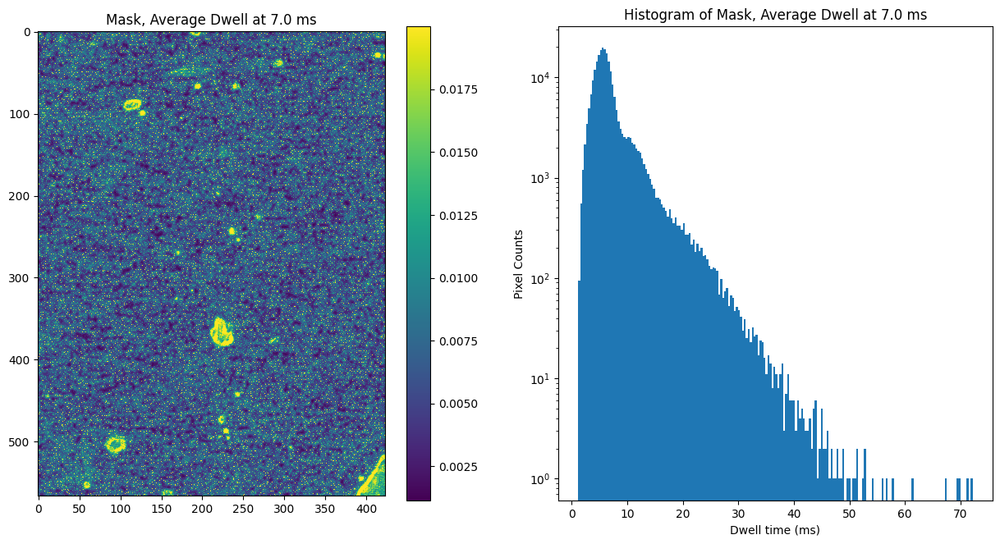

In [62]:
display_mask(mask_disp = mask_next,
             name = 'Mask, Average Dwell at {:.5} ms'.format(1000 * mask_next.mean()),
             rng = [0,20*ms],
            #  rng = [0.0, mask_next.max()],
             hist_bins = 200)
print(mask_next.mean())

In [63]:
mask_next.min()

0.0011476357

In [64]:
# Save mask
if not os.path.exists(mask_path):
    save_mask(mask_next, mask_path)
    print('Mask saved.')
else:
    print('Mask was already saved.')




Mask was already saved.


## 4.B. XRF Resampling

In [65]:
# sim2_xrf_path = os.path.join(mask_dir, mask_str + '.h5')

# if not os.path.exists(sim2_xrf_path):
#     xrf_sim2 = xrf_act.sample(mask_next) + xrf_sim
#     print('XRF was resampled.')
# else:
#     xrf_sim2 = xp.xrf(sim2_xrf_path)
#     print('Resampled XRF was loaded.')

In [66]:
xrf_sim2 = xrf_act.sample(mask_next) + xrf_sim
print('XRF was resampled.')

XRF was resampled.


In [67]:
D_sim2, A_sim2 = xrf_sim2.fit_spectra(config)

In [68]:
A_sim2.save("results/nn/",element)

In [69]:
sim2_err = []

# Calculate error of simulated XRF volume
# err = calculate_error(xrf_sim2.astype(np.single).rates(),
#                       xrf_act.astype(np.single).rates())
# sim2_err.append(['Vol', err['MSE'], err['RMSE'], err['PNLL']])

# Calculate error of simulated XRF maps
for i in range(A_sim2.shape[0]):
    err = calculate_error(A_sim2[i,:,:].rates().astype(np.single),
                            A_act[i,:,:].rates().astype(np.single))
    sim2_err.append([A_act.elements[i], err['MSE'], err['RMSE'], err['PNLL']])

print_error(sim2_err)

Data	MSE		RMSE		PNLL
Ar K	8.277e+04	2.877e+02	8.550e+01
Au L	1.216e+05	3.487e+02	1.277e+02
Au M	6.610e+02	2.571e+01	2.795e+01
Ca K	3.432e+04	1.853e+02	5.704e+01
Cu K	5.781e+05	7.604e+02	4.317e+01
Fe K	1.439e+05	3.793e+02	4.594e+01
Hg L	2.202e+05	4.692e+02	6.868e+01
Hg M	1.845e+05	4.296e+02	6.441e+01
K K	8.350e+03	9.138e+01	6.817e+01
Mn K	2.731e+04	1.652e+02	3.049e+01
Ni K	3.907e+04	1.977e+02	2.607e+01
Pb L	5.247e+06	2.291e+03	4.868e+01
Pb M	5.669e+05	7.529e+02	1.170e+02
Rh K	6.725e+06	2.593e+03	1.557e+03
Rh L	2.064e+05	4.543e+02	5.507e+01
S K	3.234e+02	1.798e+01	2.645e+01
Sn K	2.995e+03	5.473e+01	2.483e+01
Sn L	3.819e+04	1.954e+02	7.518e+01
Ti K	4.554e+03	6.748e+01	3.374e+01
Zn K	6.619e+04	2.573e+02	6.301e+01


At this point, there should be three XRF volumes: `xrf_act`, `xrf_sim`, and `xrf_sim2`.
These are very large volumes, so we recommend freeing `xrf_sim` and variables associated with it to free up memory.
To do so, please set the variable `free_xrf_sim` to `True` and run the next few blocks.

In [34]:
free_xrf_sim = True

if free_xrf_sim:
    del xrf_sim, D_sim, A_sim
    print('Freed first pass variables from memory.')

Freed first pass variables from memory.


### 2.A.b. Save Simulated XRF Volume

Here you can save the XRF volume.

## 2.B. Initial Fit Spectra

Use this to generate the elemental maps through PyMca.
These maps represent an abundance $\mathbf{A} \in \mathbb{R}_+^{M \times H \times W}$ where $M$ is the number of maps generated.
Each map denotes the amount of a set response from each element, which we denote as $D \in \mathbb{R}_+^{C \times M}$.
We will use the fit as an initial estimation for denoising. 

In [53]:
# Fit spectra on simulated data
sim2_dict_path = os.path.join(mask_dir, mask_str + '_spectra.csv')

sim2_map_path = os.path.join(mask_dir,
                             mask_str + '_maps')
sim2_map_path_prefix = mask_str + '_'

if os.path.exists(sim2_dict_path) and os.path.exists(sim2_map_path):
    D_sim2 = xp.spectrum(sim2_dict_path)
    A_sim2 = xp.elemap(sim2_map_path)
    print('Simulated dictionary and abundance were read in.')
else:
    D_sim2, A_sim2 = xrf_sim2.fit_spectra(config)
    print('Simulated dictionary and abundance were generated.')

NameError: name 'mask_dir' is not defined

### 2.B.a. Visualize Spectra

Below, you can visualize the maps. Set `rng_min` and/or `rng_max` to `None` to automatically find a display range.

### 2.B.b. Save Elemental Maps

Here you can optionally save the maps.
The first block is for saving the maps from the actual data, and the second is for the simulated data.

In [34]:
# Save simluated maps
if not os.path.exists(sim2_map_path):
    A_sim2.save(sim2_map_path, sim2_map_path_prefix)
    print('Simulated maps are saved.')
else:
    print('Simulated maps already exist.')

Simulated maps are saved.


In [35]:
# Save simulated dictionary
if not os.path.exists(sim2_dict_path):
    D_sim2.save(sim2_dict_path)
    print('Simulated spectra are saved.')
else:
    print('Simulated spectra already exist.')

Simulated spectra are saved.


In [36]:
sim2_err_path = os.path.join(mask_dir, mask_str + '_error.csv')

if not os.path.exists(sim2_err_path):

    sim2_err = []

    # Calculate error of simulated XRF volume
    # err = calculate_error(xrf_sim2.astype(np.single).rates(),
    #                       xrf_act.astype(np.single).rates())
    # sim2_err.append(['Vol', err['MSE'], err['RMSE'], err['PNLL']])

    # Calculate error of simulated XRF maps
    for i in range(A_sim2.shape[0]):
        err = calculate_error(A_sim2[i,:,:].rates().astype(np.single),
                              A_act[i,:,:].rates().astype(np.single))
        sim2_err.append([A_act.elements[i], err['MSE'], err['RMSE'], err['PNLL']])
        
    print('Simulated errors were calculated.\n')
    
else:
    sim2_err, _ = read_error(sim2_err_path)
    print('Simulated errors were read in.\n')
                
print_error(sim2_err)

Simulated errors were calculated.

Data	MSE		RMSE		PNLL
Ar K	1.857e+05	4.309e+02	1.364e+02
Au L	1.176e+05	3.429e+02	1.412e+02
Au M	5.266e+03	7.257e+01	3.955e+01
Ca K	8.173e+04	2.859e+02	1.049e+02
Cu K	1.616e+06	1.271e+03	1.089e+02
Fe K	3.609e+05	6.007e+02	1.094e+02
Hg L	4.600e+05	6.782e+02	1.130e+02
Hg M	3.003e+05	5.480e+02	1.231e+02
K K	2.030e+04	1.425e+02	1.142e+02
Mn K	6.352e+04	2.520e+02	5.918e+01
Ni K	8.339e+04	2.888e+02	5.473e+01
Pb L	1.276e+07	3.572e+03	1.184e+02
Pb M	1.154e+06	1.074e+03	2.517e+02
Rh K	1.390e+07	3.729e+03	2.092e+03
Rh L	5.098e+05	7.140e+02	1.459e+02
S K	6.175e+03	7.858e+01	4.448e+01
Sn K	6.406e+03	8.004e+01	3.346e+01
Sn L	8.425e+04	2.903e+02	1.192e+02
Ti K	1.914e+04	1.383e+02	5.685e+01
Zn K	1.526e+05	3.906e+02	1.180e+02


In [37]:
# Save results
if not os.path.exists(sim2_err_path):
    save_error(sim2_err_path, sim2_err, header = ['Data', 'MSE', 'RMSE', 'PNLL'])
    print('Error saved.')
else:
    print('Error was already saved.')

Error saved.


In [37]:
del xrf_sim2


## 3.B. Volume Denoising

Use the following code blocks to optimize the XRF volume.

## 3.C. Elemental Map Denoising

### 3.C.b. Save Denoised Results

## 3.D. Elemental Map Hyperparameter Optimization

If the data for smoothing is sampled from the original scan, the optimal hyperparameter can be selected by trying different values.

In [39]:
# Optimized results directory
opt2_dir = os.path.join(mask_dir, mask_str + '_den_ltv_opt')

# Optimized maps directory
opt2_map_dir = os.path.join(opt2_dir, mask_str + '_den_ltv_opt_maps')
opt2_map_dir_prefix = mask_str + '_den_ltv_opt_'

# Optimized parameter
opt2_error_path = os.path.join(opt2_dir, mask_str + '_den_ltv_opt_error.csv')

if os.path.exists(opt2_map_dir) and os.path.exists(opt2_error_path):
    opt2_maps = xp.elemap(opt2_map_dir)
    opt2_err, _ = read_error(opt2_error_path)
    
    opt2_results = []
    for i in range(opt2_maps.shape[0]):
        opt2_results.append([opt2_maps[i,:,:], opt2_err[i][1:5]])
        
    print('Optimized maps ({}) and error were read in.'.format(', '.join(opt2_maps.names[0])))
    
else:
    print('No optimized maps found.')

No optimized maps found.


In [40]:
# Safegaurd opt_results resetting
if 'opt2_results' not in locals():
    opt2_results = []

# WARNING: THIS WILL RESET THE OPTIMIZED RESULTS! Uncomment line 5 to reset, then recomment
# opt2_results = []

print('Number of optimized results: {}'.format(len(opt2_results)))

Number of optimized results: 0


In [42]:
# Map selection
elem = 'Au L'

# Parameter selection
lr = 5e-2
eps = 1e-10
beta = 16.0
verbose = True

# Initializations - do not modify
l_tv_plot_x2 = []
l_tv_plot_y2 = []
best_ltv2 = None
best_map2 = None

w_reg: 0.010000
PNLL: 49.408485

w_reg: 0.020000
PNLL: 43.833679

w_reg: 0.030000
PNLL: 43.750137

w_reg: 0.040000
PNLL: 45.386581

w_reg: 0.050000
PNLL: 47.332283

w_reg: 0.060000
PNLL: 50.209141

w_reg: 0.070000
PNLL: 52.757099

w_reg: 0.080000
PNLL: 54.245541

w_reg: 0.090000
PNLL: 57.248772

w_reg: 0.100000
PNLL: 59.710087

Optimal l_tv:  0.03
l_tv optimization for Au L


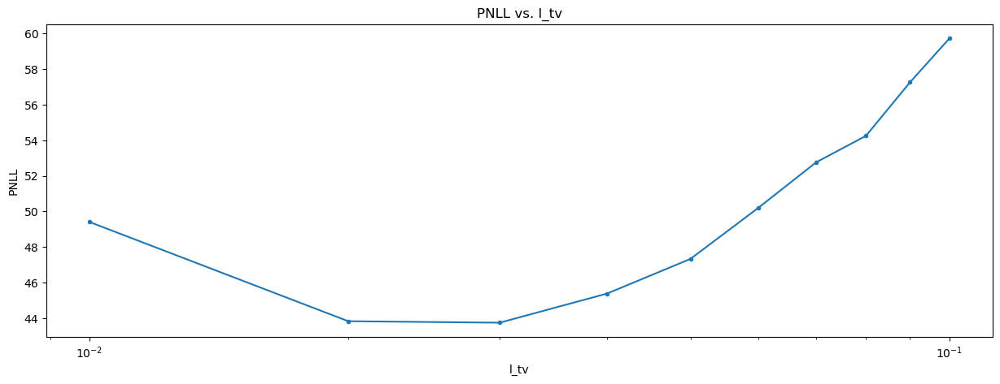

Minimum at (l_tv, l_tv_err) = (0.030000, 43.750137)


In [ ]:
# Optimize
if 'rgb' not in locals():
    rgb = None
# l_tv = [10 ** i for i in range(-3,0)]
l_tv = [0.01    * i for i in range(1,11)]
# l_tv = [0.001 * i for i in range(9,7,-1)]
opt2_map, opt2_ltv, opt2_err, ltv2_err = opt.denoise_map_hyp_opt(elemap = A_sim2[elem],
                                                                 elemap_gt = A_act[elem],
                                                                 loss_fid = loss_fid,
                                                                 loss_reg = loss_reg,
                                                                 w_reg = l_tv,
                                                                 lr = lr,
                                                                 verbose = verbose)

# Store results
l_tv_plot_x2 += l_tv
l_tv_plot_y2 += ltv2_err.tolist()

# Best results
if l_tv_plot_x2[np.array(l_tv_plot_y2).argmin()] != best_ltv2:
    best_ltv2 = l_tv_plot_x2[np.array(l_tv_plot_y2).argmin()]
    best_map2 = opt2_map
    
print('Optimal l_tv: ', best_ltv2)

print('l_tv optimization for ' + elem)
l_tv_plot(l_tv_plot_x2, l_tv_plot_y2)

In [44]:
opt2_results.append([best_map2, [best_ltv2, eps, beta, lr]])

### 3.D.a. Analysis

Here, we calculate the PNLL and MSE assuming the optimized map is from the simulation.

In [45]:
# Error printing
opt2_err = []
for i in range(len(opt2_results)):
    err = calculate_error(opt2_results[i][0].rates(),
                          A_act[opt2_results[i][0].names[0][0]].rates())
    opt2_err.append([opt2_results[i][0].names[0][0], *opt2_results[i][1], err['MSE'], err['RMSE'], err['PNLL']])

print('Simulated Error')
print_error(list(filter(lambda x: x[0] in [opt2_err[i][0] for i in range(len(opt2_err))],
                        sim2_err)))
print('\nOptimized Error')
print_error([[i[0], *i[-3:]] for i in opt2_err])


Simulated Error
Data	MSE		RMSE		PNLL
Au L	1.118e+05	3.344e+02	1.373e+02

Optimized Error
Data	MSE		RMSE		PNLL
Au L	2.122e+04	1.457e+02	4.375e+01


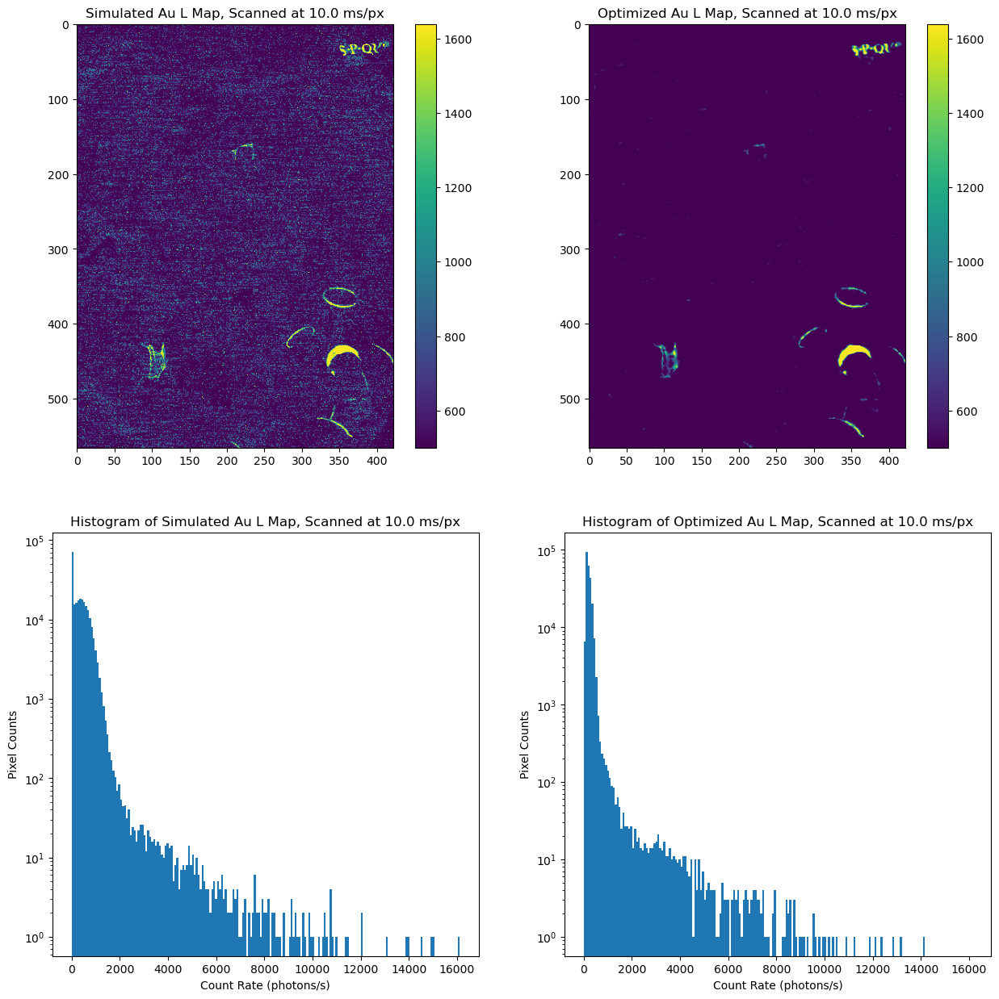

In [46]:
# Compare maps
compare_maps(map_left = A_sim2[elem].rates().squeeze(),
             map_right = opt2_map.rates().squeeze(),
             name_left = 'Simulated ' + elem + ' Map, Scanned at {:.5} ms/px'.format(1000 * dwell_total),
             name_right = 'Optimized ' + elem + ' Map, Scanned at {:.5} ms/px'.format(1000 * dwell_total),
             rng = [500, None],
             hist_bins = 200)

### 3.D.b. Save Results

In [ ]:
opt2_maps = xp.elemap(data = np.array([opt2_results[i][0].squeeze() for i in range(len(opt2_results))]),
                      dwell = A_sim2.dwell,
                      origin = [0.0, origin[0], origin[1]],
                      spacing = [1.0, spacing[0], spacing[1]],
                      names = [[opt2_results[i][0].names[0][0] for i in range(len(opt2_results))], [], []])

In [ ]:
# Save denoised results
opt2_maps.save(opt2_map_dir, opt2_map_dir_prefix)

save_error(opt2_error_path, opt2_err, header = ['Data', 'l_tv', 'eps', 'beta', 'lr', 'MSE', 'RMSE', 'PNLL'])